<table style="background-color: transparent;">
    <tr style="background-color: transparent;">
        <td width="400px"><font size="15px" color="#f25625">Cuarta<br>Escuela<br>de Verano</font></td>
        <td>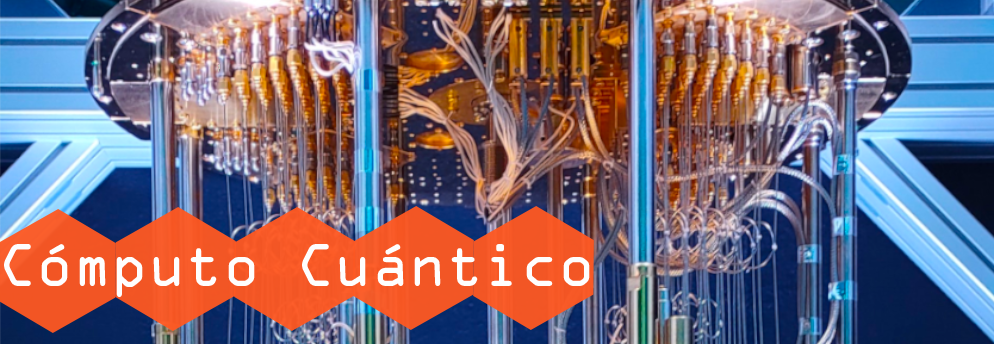</td>
    </tr>
</table>

<p style="text-align:right; font-weight:bold;">Autora: Claudia Zendejas-Morales</p>

$ \newcommand{\bra}[1]{\langle #1|} $
$ \newcommand{\ket}[1]{|#1\rangle} $
$ \newcommand{\braket}[2]{\langle #1|#2\rangle} $
$ \newcommand{\mymatrix}[2]{\left[ \begin{array}{#1} #2\end{array} \right]} $
$ \newcommand{\myvector}[1]{\mymatrix{c}{#1}} $

# <center> Sistemas Multi-Qubits

## Contenido

1. [Sistemas con más de un Qubit](#1)
   1. [Estados multi-qubit](#1.1)
   2. [Compuertas de un qubit en estados multi-qubit](#1.2)
   3. [Compuertas de dos qubits](#1.3)
      1. [Compuerta $CNOT$ o $CX$](#1.3.1)
      2. [Compuertas controladas](#1.3.2)
      3. [Compuerta $SWAP$](#1.3.3)
   4. [Compuertas de más qubits](#1.4)
      1. [Compuerta Toffoli , $CCNOT$ o $CCX$](#1.4.1)
      2. [Compuerta Fredkin o $CSWAP$](#1.4.2)
      3. [Compuerta controlada personaliza](#1.4.3)
2. [Estados de Bell: Entrelazamiento](#2)
3. [QSphere, otra forma de visualizar estados multi-qubit](#3)
4. [Simular Circuitos Cuánticos](#4)
      1. [Medición](#4.1)
      2. [Ejemplo: Estado GHZ](#4.2)
      3. [Estadística: Múltiples *shots*](#4.3)
      4. [Primitivas de Qiskit](#4.4)
          1. [Sampler](#4.4.1)
          2. [Estimator](#4.4.2)
5. [Errores y cómo corregirlos](#5)
   1. [Mitigación de errores](#5.1)
   2. [Corrección de errores](#5.2)
   3. [Diferencias](#5.3)
6. [Referencias](#6)

<a id="0"></a>
## 0. Breve historia

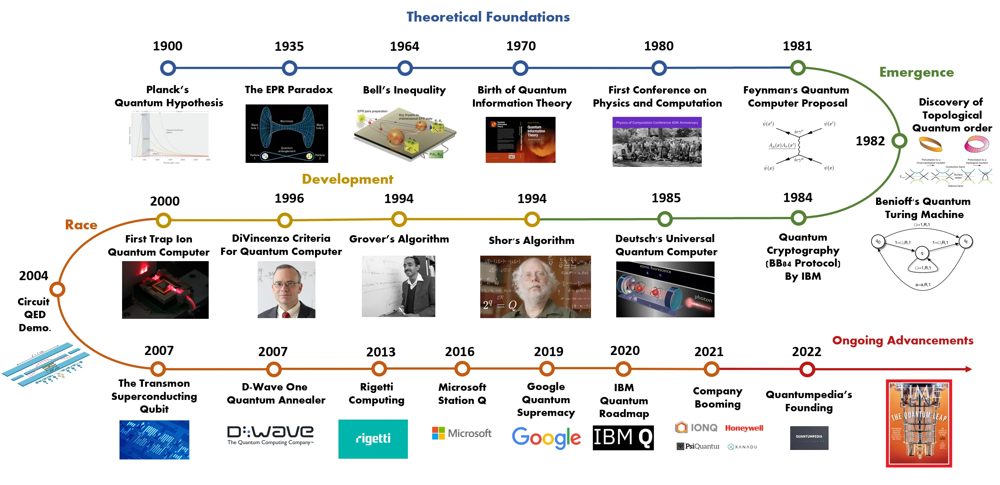

<p style="font-size:10px;font-style:italic;text-align:right"><a href="https://quantumpedia.uk/a-brief-history-of-quantum-computing-e0bbd05893d0" target="_blank"><font size="2">Imagen obtenida de QUANTUMPEDIA - The Quantum Encyclopedia</font></a></p>

Distintas empresas están desarrollando tecnologías cuánticas basadas en diferentes tipos de qubits:

<div align="center">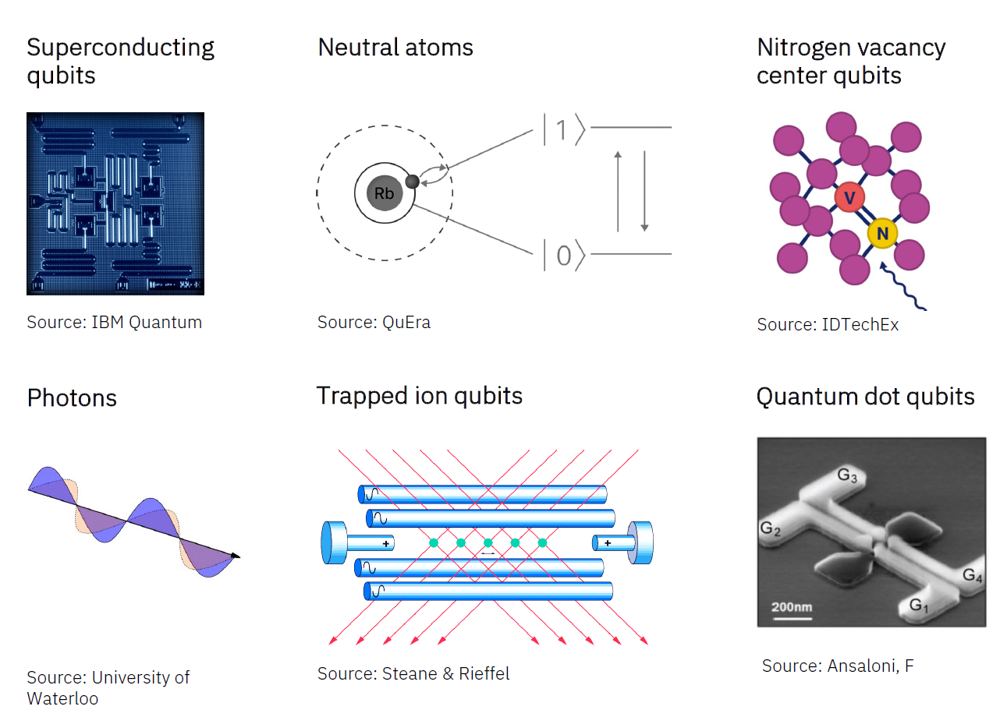

El objetivo a largo plazo es construir **chips cuánticos universales**, capaces de ejecutar distintos algoritmos con alta fidelidad. En la imagen siguiente se muestra un ejemplo del chip [IBM Heron](https://quantum.cloud.ibm.com/docs/en/guides/processor-types#heron), que utiliza qubits superconductores y acopladores ajustables.

<div align="center">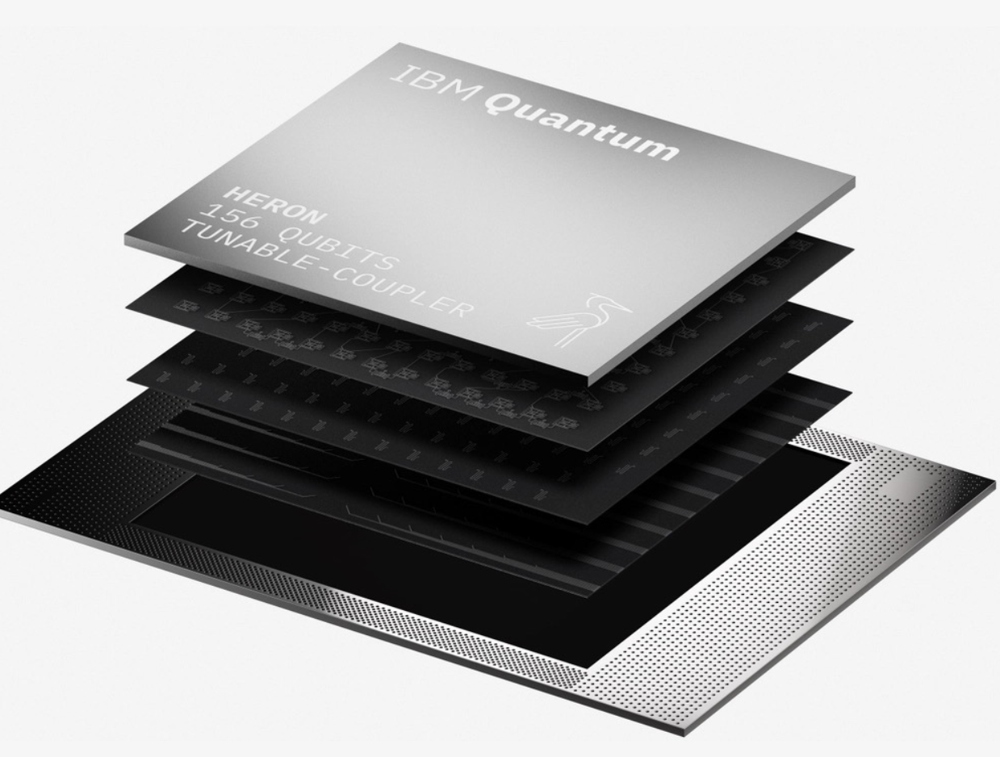

<a id="1"></a>
## 1. Sistemas con más de un Qubit

Hemos visto algunos efectos interesantes con qubits individuales y compuertas de un qubit, pero el verdadero poder de la computación cuántica se realiza a través de las interacciones entre qubits. En este notebook, presentaremos compuertas de múltiples qubits y exploraremos comportamientos interesantes de los sistemas multi-qubit.

Por lo general, las compuertas que se pueden implementar directamente en el hardware actuarán solo en uno o dos qubits. En nuestros circuitos, podemos querer usar compuertas complejas que actúen sobre una gran cantidad de qubits. Afortunadamente, esto no será un problema. Con las compuertas de uno y dos qubits que nos proporciona el hardware, es posible construir cualquier otra compuerta.

<a id="1.1"></a>
## 1.1. Estados multi-qubit

La dimensión del espacio de Hilbert para $n$ qubits está dada por $2^n$. Para obtenerla se usa el **producto tensorial** (o *[producto de Kronecker](https://en.wikipedia.org/wiki/Kronecker_product)* en el caso de matrices y vectores).

# Recordatorio: Producto tensorial

El producto tensorial, denotado por $\otimes$, se puede aplicar a vectores y matrices (en general a [tensores](https://en.wikipedia.org/wiki/Tensor)). Actúa como sigue,

$$\vec{a}\otimes\vec{b}=\mymatrix{r}{ a_1 \\ a_2 }\otimes\mymatrix{r}{ b_1 \\ b_2 }=\mymatrix{r}{ a_1\mymatrix{r}{ b_1 \\ b_2 } \\ a_2\mymatrix{r}{ b_1 \\ b_2 } }=\mymatrix{r}{ a_1b_1 \\ a_1b_2 \\ a_2b_1 \\ a_2b_2 }$$

$$C\otimes D=\mymatrix{r}{ c_{11} & c_{12} \\ c_{21} & c_{22} }\otimes\mymatrix{r}{ d_{11} & d_{12} \\ d_{21} & d_{22} }=\mymatrix{r}{ c_{11}\mymatrix{r}{ d_{11} & d_{12} \\ d_{21} & d_{22} } & c_{12}\mymatrix{r}{ d_{11} & d_{12} \\ d_{21} & d_{22} } \\ c_{21}\mymatrix{r}{ d_{11} & d_{12} \\ d_{21} & d_{22} } & c_{22}\mymatrix{r}{ d_{11} & d_{12} \\ d_{21} & d_{22} } }=\mymatrix{r}{ c_{11}d_{11} & c_{11}d_{12} & c_{12}d_{11} & c_{12}d_{12} \\ c_{11}d_{21} & c_{11}d_{22} & c_{12}d_{21} & c_{12}d_{22} \\ c_{21}d_{11} & c_{21}d_{12} & c_{22}d_{11} & c_{22}d_{12} \\ c_{21}d_{21} & c_{21}d_{22} & c_{22}d_{21} & c_{22}d_{22}}$$

### El espacio de 2 qubits

El espacio de Hilbert de un estado cuántico formado por dos qubits, $n=2$, tendrá una dimensión de $2^2=4$. Por ejemplo, el estado formado por dos qubits, cada uno en $\ket{0}$ es,

$$\ket{0}\otimes\ket{0}=\ket{00}=\mymatrix{r}{ 1 \\ 0 }\otimes\mymatrix{r}{ 1 \\ 0 }=\mymatrix{r}{ 1\mymatrix{r}{ 1 \\ 0 } \\ 0\mymatrix{r}{ 1 \\ 0 } }=\mymatrix{r}{ 1 \\ 0 \\ 0 \\ 0 }$$

Ahora, considerando todas las posibles combinaciones de los estados base para cada uno de los dos qubits, tenemos que,

$$\ket{0}\otimes\ket{0}=\ket{00}=\mymatrix{r}{ 1 \\ 0 \\ 0 \\ 0 }$$

$$\ket{0}\otimes\ket{1}=\ket{01}=\mymatrix{r}{ 0 \\ 1 \\ 0 \\ 0 }$$

$$\ket{1}\otimes\ket{0}=\ket{10}=\mymatrix{r}{ 0 \\ 0 \\ 1 \\ 0 }$$

$$\ket{1}\otimes\ket{1}=\ket{11}=\mymatrix{r}{ 0 \\ 0 \\ 0 \\ 1 }$$

Notemos que debido a que estamos usando la *base computacional* para los qubits, podemos tener una relación directa con la representación de los números decimales en binario; es decir, el estado $\ket{00}$ tiene un $1$ en la posición $0$ del vector de estado de cuatro elementos, el estado $\ket{10}$ tienen un $1$ en la posición $2$ (contando desde cero), pues se cumple que $10_{binario} = 2_{decimal}$.


### El espacio de 3 qubits

Para el caso de $n=3$, tenemos que la dimensión es $2^3=8$, entonces los vectores de estado para este espacio de Hilbert, en la base computacional, serían:

$$\ket{000}=\mymatrix{r}{ 1 \\ 0 \\ 0 \\ 0 \\ 0 \\ 0 \\ 0 \\ 0 }, ~~~~ \ket{001}=\mymatrix{r}{ 0 \\ 1 \\ 0 \\ 0 \\ 0 \\ 0 \\ 0 \\ 0 }, ~~~~ \ket{010}=\mymatrix{r}{ 0 \\ 0 \\ 1 \\ 0 \\ 0 \\ 0 \\ 0 \\ 0 }, ~~~~ \ket{011}=\mymatrix{r}{ 0 \\ 0 \\ 0 \\ 1 \\ 0 \\ 0 \\ 0 \\ 0 }$$

$$\ket{100}=\mymatrix{r}{ 0 \\ 0 \\ 0 \\ 0 \\ 1 \\ 0 \\ 0 \\ 0 }, ~~~~ \ket{101}=\mymatrix{r}{ 0 \\ 0 \\ 0 \\ 0 \\ 0 \\ 1 \\ 0 \\ 0 }, ~~~~ \ket{110}=\mymatrix{r}{ 0 \\ 0 \\ 0 \\ 0 \\ 0 \\ 0 \\ 1 \\ 0 }, ~~~~ \ket{111}=\mymatrix{r}{ 0 \\ 0 \\ 0 \\ 0 \\ 0 \\ 0 \\ 0 \\ 1 }$$

<a id="1.2"></a>
## 1.2. Compuertas de un qubit en estados multi-qubit

Las compuertas de un solo qubit que actúan en estados multi-qubit, deben tener la dimension correcta para poder efectuar la multiplicación matriz por vector.

Si por ejemplo tenemos esto: $H\ket{q_1q_0}$, no se puede saber a cual de los dos qubits se le debe aplicar la compuerta $H$ si a $\ket{q_1}$ o a $\ket{q_0}$, entonces se debe ser explícito. Si lo que se desea es aplicar $H$ al $\ket{q_0}$ se debe escribir:

$$I\otimes H \; \ket{q_1q_0}$$

Lo que implica que se aplicará la compuerta *identidad* al $\ket{q_1}$, es decir, no será afectado.

La compuerta $I\otimes H$ a aplicar al estado de 2 qubits es:

$$I\otimes H=\mymatrix{r}{ 1 & 0 \\ 0 & 1 }\otimes\mymatrix{rr}{\frac{1}{\sqrt{2}} & \frac{1}{\sqrt{2}} \\ \frac{1}{\sqrt{2}} & -\frac{1}{\sqrt{2}}}=\mymatrix{r}{ 1\mymatrix{rr}{\frac{1}{\sqrt{2}} & \frac{1}{\sqrt{2}} \\ \frac{1}{\sqrt{2}} & -\frac{1}{\sqrt{2}}} & 0\mymatrix{rr}{\frac{1}{\sqrt{2}} & \frac{1}{\sqrt{2}} \\ \frac{1}{\sqrt{2}} & -\frac{1}{\sqrt{2}}} \\ 0\mymatrix{rr}{\frac{1}{\sqrt{2}} & \frac{1}{\sqrt{2}} \\ \frac{1}{\sqrt{2}} & -\frac{1}{\sqrt{2}}} & 1\mymatrix{rr}{\frac{1}{\sqrt{2}} & \frac{1}{\sqrt{2}} \\ \frac{1}{\sqrt{2}} & -\frac{1}{\sqrt{2}}} }=\mymatrix{rrrr}{ \frac{1}{\sqrt{2}} & \frac{1}{\sqrt{2}} & 0 & 0 \\ \frac{1}{\sqrt{2}} & -\frac{1}{\sqrt{2}} & 0 & 0 \\ 0 & 0 & \frac{1}{\sqrt{2}} & \frac{1}{\sqrt{2}} \\ 0 & 0 & \frac{1}{\sqrt{2}} & -\frac{1}{\sqrt{2}} }$$

En Qiskit podemos usar la clase `Operator` para obtener el operador equivalente a las compuertas agregadas a un circuito, veamos le ejemplo anterior:

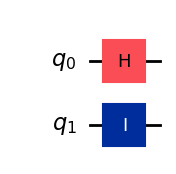

<IPython.core.display.Latex object>

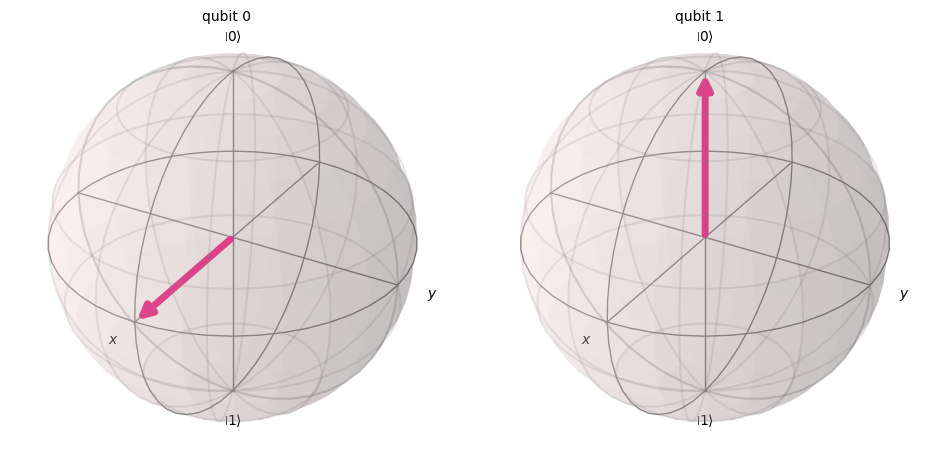

In [1]:
from qiskit import QuantumCircuit
from qiskit.quantum_info import Statevector
from qiskit.visualization import array_to_latex
from qiskit.visualization import plot_bloch_multivector
from qiskit.quantum_info import Operator

circuit = QuantumCircuit(2) # circuito con 2 qubits

circuit.h(0)    # Hadamard en q0
circuit.id(1)   # Identidad en q1

display(circuit.draw('mpl'))

op = Operator(circuit)
display(array_to_latex(op))

psi = Statevector(circuit)

display(plot_bloch_multivector(psi))

Ejemplo con $3$ qubits $\ket{q_2 \, q_1 \, q_0}$:

$$H\otimes R_y(3\pi/5) \otimes R_x(\pi/4) \; \ket{000}$$

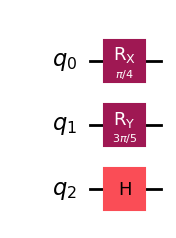

<IPython.core.display.Latex object>

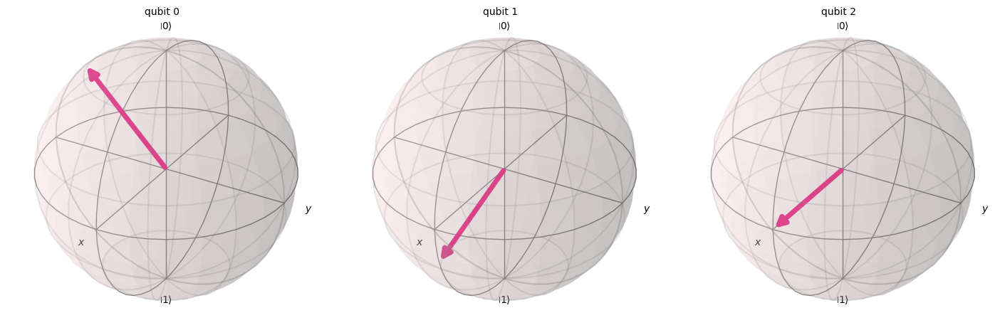

In [2]:
import numpy as np

circuit = QuantumCircuit(3) # circuito con 3 qubits

circuit.rx(np.pi/4, 0)      # Rx de pi/4  al q0
circuit.ry(3*np.pi/5, 1)    # Ry de 3pi/5 al q1
circuit.h(2)                # Hadamard al q2

display(circuit.draw('mpl'))

op = Operator(circuit)
display(array_to_latex(op))

psi = Statevector(circuit)

print()
display(plot_bloch_multivector(psi))

**Nota**: Si se aplica la misma compuerta a todos los qubits de un estado, se puede indicar usando el símbolo del producto tensorial en el superíndice, como por ejemplo, la compuerta $H$:

$$\underbrace{H\otimes\cdots\otimes H}_{n~veces}=\bigotimes_1^n H=H^{\otimes n}$$

<a id="1.3"></a>
## 1.3. Compuertas de dos qubits

Ahora que ya sabemos cómo son los estados multi-qubit, podemos revisar las compuertas que son aplicadas a más de un qubit. Primero veamos algunas compuertas que necesitan dos qubits para operar.

<a id="1.3.1"></a>
### 1.3.1. Compuerta $CNOT$ o $CX$

Se trata de una compuerta controlada, actúa sobre dos qubits, en donde uno de ellos sirve como control y el otro como el objetivo. Se aplicará una operación $NOT$ o $X$ en el qubit objetivo, solo cuando el qubit control sea $\ket{1}$ y si no lo es, entonces el qubit objetivo permance sin cambio, por lo que, si el qubit de la izquierda ($\ket{q_1}$) es el control y el de la derecha ($\ket{q_0}$) es el objetivo, en el estado $\ket{q_1q_0}$, las transiciones son:

$$CNOT_{1,0}\ket{00}=\ket{00}$$
$$CNOT_{1,0}\ket{01}=\ket{01}$$
$$CNOT_{1,0}\ket{10}=\ket{11}$$
$$CNOT_{1,0}\ket{11}=\ket{10}$$

donde los subíndices en $CNOT$ indican el qubit control y el objetivo, en ese orden.

Dado esto podríamos tener otra versión del $CNOT$ en donde el qubit control sea $q_0$ y el objetivo sea $q_1$, las transiciones para este caso serían,

$$CNOT_{0,1}\ket{00}=\ket{00}$$
$$CNOT_{0,1}\ket{01}=\ket{11}$$
$$CNOT_{0,1}\ket{10}=\ket{10}$$
$$CNOT_{0,1}\ket{11}=\ket{01}$$

El order predeterminado en la mayoría de las referencias es que el qubit de la izquierda es el control, mientras que el de la derecha es el objetivo.

Conociendo la definición de la compuerta y las transiciones, podemos obtener la matriz que representa a la operación $CNOT$:

<table width='50%'>

<tr>
<td style='width:50%; text-align: center'><strong>Transiciones</strong></td>
<td style='width:50%; text-align: center'><strong>Matriz</strong></td>
</tr>

<tr>
<td style='width:50%; text-align: center'>
Compuerta $CNOT_{1,0}$:

$$\ket{00}\rightarrow\ket{00}$$
$$\ket{01}\rightarrow\ket{01}$$
$$\ket{10}\rightarrow\ket{11}$$
$$\ket{11}\rightarrow\ket{10}$$
</td>
<td style='width:50%; text-align: center'>
$
\begin{array}{c|cc} \hookleftarrow & \ket{00} & \ket{01} & \ket{10} & \ket{11} \\ \hline 
    \ket{00} & 1 & 0 & 0 & 0 \\ 
    \ket{01} & 0 & 1 & 0 & 0 \\ 
    \ket{10} & 0 & 0 & 0 & 1 \\ 
    \ket{11} & 0 & 0 & 1 & 0 \end{array}
$
</td>
</tr>

<tr>
<td style='width:50%; text-align: center'>
Compuerta $CNOT_{0,1}$:

$$\ket{00}\rightarrow\ket{00}$$
$$\ket{01}\rightarrow\ket{11}$$
$$\ket{10}\rightarrow\ket{10}$$
$$\ket{11}\rightarrow\ket{01}$$
</td>
<td style='width:50%; text-align: center'>
$
\begin{array}{c|cc} \hookleftarrow & \ket{00} & \ket{01} & \ket{10} & \ket{11} \\ \hline 
    \ket{00} & 1 & 0 & 0 & 0 \\ 
    \ket{01} & 0 & 0 & 0 & 1 \\ 
    \ket{10} & 0 & 0 & 1 & 0 \\ 
    \ket{11} & 0 & 1 & 0 & 0 \end{array}
$
</td>
</tr>

</table>

En Qiskit se cuenta con el método `cx(c, t)`, que recibe el qubit de control como primer parámetro y el qubit objetivo como segundo parámetro.

Este es el caso para CNOT(0,1)|01> = |11>


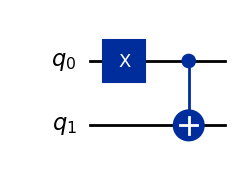

<IPython.core.display.Latex object>

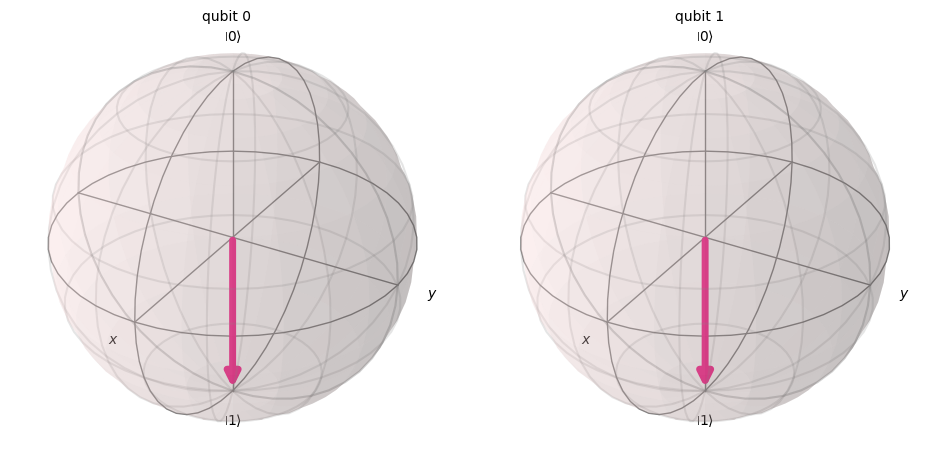

In [3]:
circ7 = QuantumCircuit(2)   # circuito con 2 qubits

circ7.x(0)                  # ponemos el control en |1> para que la compuerta sea aplicada

circ7.cx(0, 1)              # CNOT con q0 como control (primer parámetro) y q1 como objetivo (segundo parámetro)

print("Este es el caso para CNOT(0,1)|01> = |11>")

display(circ7.draw('mpl'))

op = Operator(circ7)
display(array_to_latex(op))

psi = Statevector(circ7)

print()
display(plot_bloch_multivector(psi))

Este es el caso para CNOT(1,0)|10> = |11>


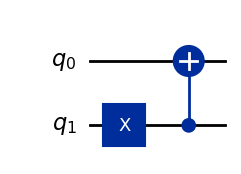

<IPython.core.display.Latex object>

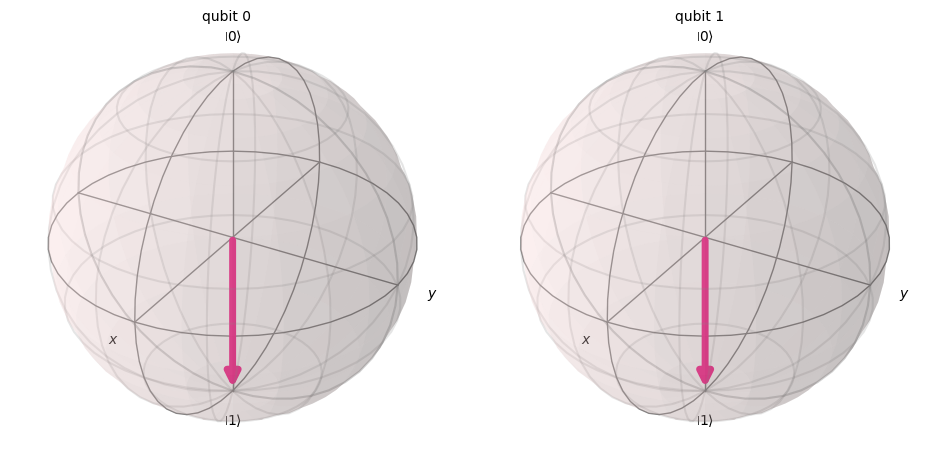

In [4]:
circ8 = QuantumCircuit(2)   # circuito con 2 qubits

circ8.x(1)                  # ponemos el control en |1> para que la compuerta sea aplicada

circ8.cx(1, 0)              # CNOT con q1 como control y q0 como objetivo

print("Este es el caso para CNOT(1,0)|10> = |11>")

display(circ8.draw('mpl'))

op = Operator(circ8)
display(array_to_latex(op))

psi = Statevector(circ8)

print()
display(plot_bloch_multivector(psi))

<a id="1.3.2"></a>
### 1.3.2. Compuertas controladas

Así como podemos controlar si aplicar la compuerta $X$ de acuerdo al estado de un qubit control, podemos controlar cualquier otra compuerta. Si tenemos la compuerta $U$, su versión controlada sería $CU$, y podemos decidir cual qubit es el control y cual es el objetivo (como para el caso de $CNOT$).

Una operación unitaria en general la podemos escribir como,

$$U=\mymatrix{rr}{ u_{11} & u_{12} \\ u_{21} & u_{22} }$$

Entonces su versión controlada $CU$, si el control es el qubit de la izquierda ($\ket{q_1}$), tendría las transiciones:

$CU_{1,0}\ket{00}=\ket{00}$

$CU_{1,0}\ket{01}=\ket{01}$

$CU_{1,0}\ket{10}=\ket{1}\otimes U\ket{0}=\ket{1}\otimes \left(u_{11}\ket{0}+u_{21}\ket{1}\right)$

$CU_{1,0}\ket{11}=\ket{1}\otimes U\ket{0}=\ket{1}\otimes \left(u_{12}\ket{0}+u_{22}\ket{1}\right)$

Su forma matricial es,

$$CU=\mymatrix{rrrr}{ 1 & 0 & 0 & 0 \\ 0 & 1 & 0 & 0 \\ 0 & 0 & u_{11} & u_{12} \\ 0 & 0 & u_{21} & u_{22} }$$

En Qiskit existen varias compuertas controladas predefinidas, en el siguiente código se usarán algunas a modo de ejemplo:

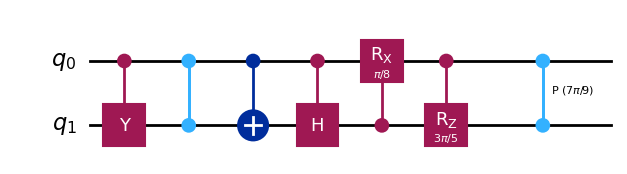

In [5]:
circ9 = QuantumCircuit(2)    # circuito con 2 qubits

circ9.cy(0, 1)               # Y controlada, qubit control es q0, y objetivo es q1
circ9.cz(1, 0)               # Z controlada, qubit control es q1, y objetivo es q0
circ9.cx(0, 1)               # X controlada, qubit control es q0, y objetivo es q1

circ9.ch(0, 1)               # H controlada, qubit control es q0, y objetivo es q1

circ9.crx(np.pi/8, 1, 0)     # Rx controlada, ángulo de pi/8, qubit control es q1, y objetivo es q0
circ9.crz(3*np.pi/5, 0, 1)   # Rz controlada, ángulo de 3pi/5, qubit control es q0, y objetivo es q1

circ9.cp(7*np.pi/9, 1, 0)    # P controlada, ángulo de 7pi/9, qubit control es q1, y objetivo es q0

display(circ9.draw('mpl'))

En Qiskit también podemos hacer controlada una compuerta particular, en general se usa esta funcionalidad para los casos en los que la compuerta es personalizada, ya que Qiskit incluye la version controlada de la mayoría de las compuertas de un qubit.

Creamos una compuerta personalizada con la clase `UnitaryGate`, a la que le debemos indicar la matriz que define a la operación, recordando que dicha matriz debe ser unitaria. Veamos un ejemplo:

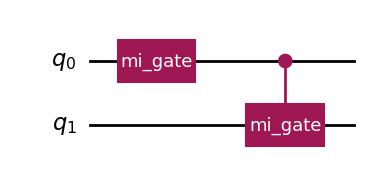

In [6]:
from qiskit.circuit.library import UnitaryGate

matrix = [[1j, 0],
          [0 , 1,]]

mi_gate = UnitaryGate(matrix, 'mi_gate')

circ10 = QuantumCircuit(2)      # circuito con 2 qubits

circ10.append(mi_gate, [0])     # le agregamos al circuito la compuerta personalizada


mi_gate_controlada = mi_gate.control(1)   # hacemos la version controlada de mi_gate, con un qubit de control

circ10.append(mi_gate_controlada, [0, 1]) # se indican los qubits, primero el control y luego el objetivo


display(circ10.draw('mpl'))

<a id="1.3.3"></a>
### 1.3.3. Compuerta $SWAP$

Esta compuerta es la única compuerta de dos qubits que no representa una operación controlada. $SWAP$ simplemente intercambia dos qubits. Es muy útil cuando se tiene restricción fisica en las conexiones entre qubits.

Sus transiciones son entonces,

$$SWAP \, \ket{00}=\ket{00}$$
$$SWAP \, \ket{01}=\ket{10}$$
$$SWAP \, \ket{10}=\ket{01}$$
$$SWAP \, \ket{11}=\ket{11}$$

Su representación matricial es,

$$SWAP=\mymatrix{rrrr}{ 1 & 0 & 0 & 0 \\ 0 & 0 & 1 & 0 \\ 0 & 1 & 0 & 0 \\ 0 & 0 & 0 & 1 }$$

La compuerta $SWAP$ puede descomponerse como,

$$SWAP = \frac{I\otimes I+X\otimes X+Y\otimes Y+Z\otimes Z}{2}$$

En Qsikit la podemos usar con `swap()` como sigue:

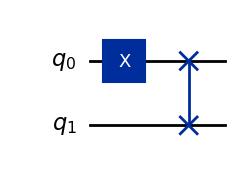

👉 Estado inicial:
➤ en forma de vector:


<IPython.core.display.Latex object>

➤ en forma de ket:


<IPython.core.display.Latex object>


👉 Estado después de SWAP:
➤ en forma de vector:


<IPython.core.display.Latex object>

➤ en forma de ket:


<IPython.core.display.Latex object>


🔵 Estado inicial:


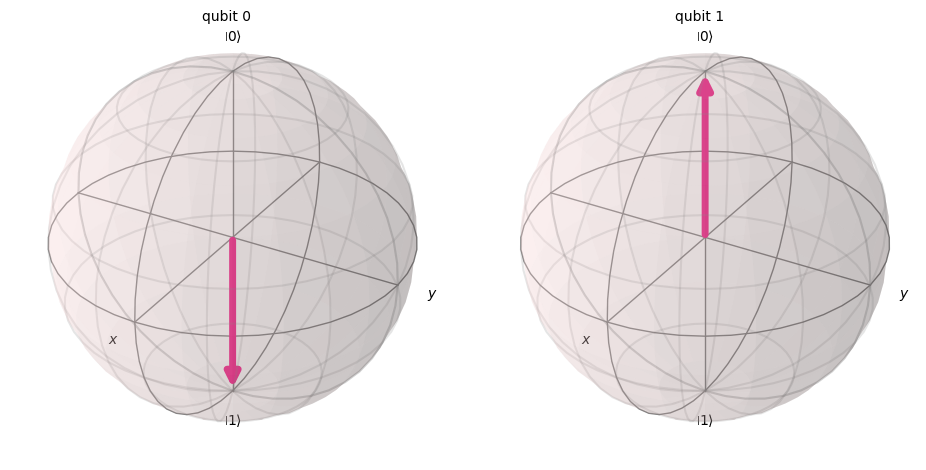

🔵 Estado después de SWAP:


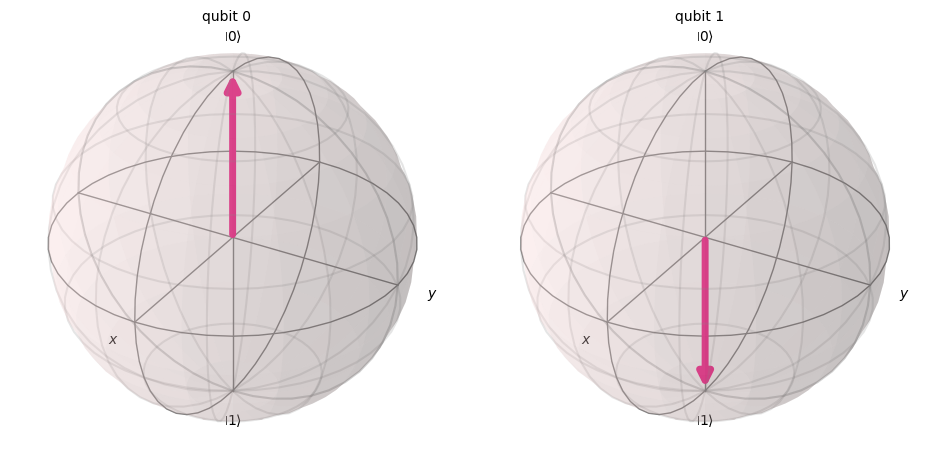

In [7]:
circ11 = QuantumCircuit(2)    # circuito con 2 qubit

circ11.x(0)                   # obtener el estado |01>

psi_0 = Statevector(circ11)   # estado justo después de crear el circuito e iniciar el qubit en |01>

circ11.swap(0, 1)             # aplicar compuerta SWAP a los dos quibits existentes

psi_1 = Statevector(circ11)   # estado después aplicar la compuerta Z

display(circ11.draw('mpl'))   # mostrar el circuito

print("👉 Estado inicial:")
print("➤ en forma de vector:")
display(array_to_latex(psi_0))
print("➤ en forma de ket:")
display(psi_0.draw('latex'))
print()
print("👉 Estado después de SWAP:")
print("➤ en forma de vector:")
display(array_to_latex(psi_1))
print("➤ en forma de ket:")
display(psi_1.draw('latex'))

print()
print("🔵 Estado inicial:")
display(plot_bloch_multivector(psi_0))

print("🔵 Estado después de SWAP:")
display(plot_bloch_multivector(psi_1))

<a id="1.4"></a>
## 1.4. Compuertas de más qubits

Las compuertas pueden estar definidas para $n$ cantidad de qubits, siempre y cuando su matriz sea unitaria. Las compuertas de más de dos qubits suelen ser compuertas con más de un control.

<a id="1.4.1"></a>
### 1.4.1. Compuerta Toffoli , $CCNOT$ o $CCX$

Es una compuerta de 3 qubits. Aplicará un $NOT$ si los dos qubits de control están en el estado $\ket{1}$, en caso contrario no aplicará ninguna operación.

Su forma matricial para el caso de que los dos qubits de la izquierda sean los controles, y el de más a la derecha sea el objetivo es como sigue,

$$CCX = \mymatrix{cccccccc}{1 & 0 & 0 & 0 & 0 & 0 & 0 & 0 \\ 0 & 1 & 0 & 0 & 0 & 0 & 0 & 0 \\ 0 & 0 & 1 & 0 & 0 & 0 & 0 & 0 \\ 0 & 0 & 0 & 1 & 0 & 0 & 0 & 0 \\ 0 & 0 & 0 & 0 & 1 & 0 & 0 & 0 \\ 0 & 0 & 0 & 0 & 0 & 1 & 0 & 0 \\ 0 & 0 & 0 & 0 & 0 & 0 & 0 & 1 \\ 0 & 0 & 0 & 0 & 0 & 0 & 1 & 0}$$

Entonces sus transiciones son,

$$CCX \, \ket{000} = \ket{000}$$
$$CCX \, \ket{001} = \ket{001}$$
$$CCX \, \ket{010} = \ket{010}$$
$$CCX \, \ket{011} = \ket{011}$$
$$CCX \, \ket{100} = \ket{100}$$
$$CCX \, \ket{101} = \ket{101}$$
$$CCX \, \ket{110} = \ket{111}$$
$$CCX \, \ket{111} = \ket{110}$$

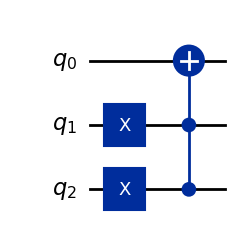

👉 Estado inicial:
➤ en forma de vector:


<IPython.core.display.Latex object>

➤ en forma de ket:


<IPython.core.display.Latex object>


👉 Estado después de CCX(1, 2, 0):
➤ en forma de vector:


<IPython.core.display.Latex object>

➤ en forma de ket:


<IPython.core.display.Latex object>


🔵 Estado inicial:


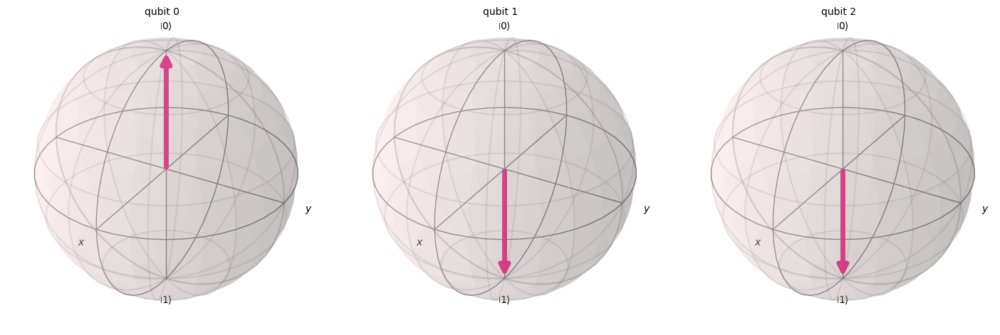

🔵 Estado después de CCX(1, 2, 0):


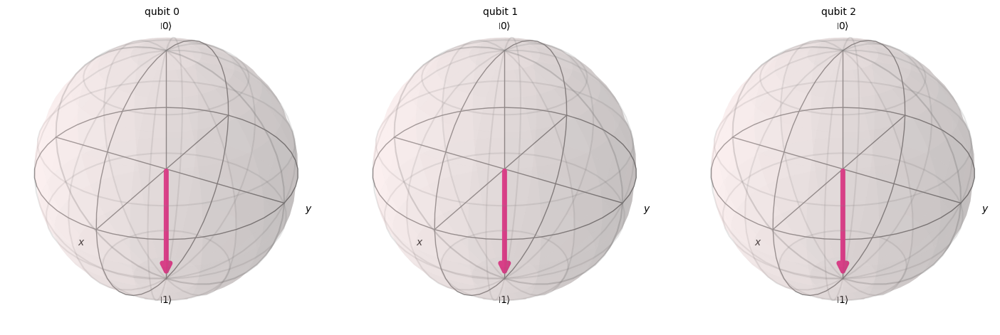

In [8]:
circ12 = QuantumCircuit(3)    # circuito con 3 qubit

circ12.x(1)                   # obtener el estado |010>
circ12.x(2)                   # obtener el estado |110>

psi_0 = Statevector(circ12)   # estado justo después de crear el circuito e iniciar el qubit en |110>

circ12.ccx(1, 2, 0)           # aplicar compuerta CCX: control1, control2, objetivo

psi_1 = Statevector(circ12)   # estado después aplicar la compuerta Z

display(circ12.draw('mpl'))   # mostrar el circuito

print("👉 Estado inicial:")
print("➤ en forma de vector:")
display(array_to_latex(psi_0))
print("➤ en forma de ket:")
display(psi_0.draw('latex'))
print()
print("👉 Estado después de CCX(1, 2, 0):")
print("➤ en forma de vector:")
display(array_to_latex(psi_1))
print("➤ en forma de ket:")
display(psi_1.draw('latex'))

print()
print("🔵 Estado inicial:")
display(plot_bloch_multivector(psi_0))

print("🔵 Estado después de CCX(1, 2, 0):")
display(plot_bloch_multivector(psi_1))

<a id="1.4.2"></a>
### 1.4.2. Compuerta Fredkin o $CSWAP$

Esta compuerta tiene un qubit de control, y si está en el estado $\ket{1}$, entonces se efectúa un $SWAP$ a los dos quibits objetivo. La forma matricial es como sigue:

$$CSWAP = \mymatrix{cccccccc}{1 & 0 & 0 & 0 & 0 & 0 & 0 & 0 \\ 0 & 1 & 0 & 0 & 0 & 0 & 0 & 0 \\ 0 & 0 & 1 & 0 & 0 & 0 & 0 & 0 \\ 0 & 0 & 0 & 1 & 0 & 0 & 0 & 0 \\ 0 & 0 & 0 & 0 & 1 & 0 & 0 & 0 \\ 0 & 0 & 0 & 0 & 0 & 0 & 1 & 0 \\ 0 & 0 & 0 & 0 & 0 & 1 & 0 & 0 \\ 0 & 0 & 0 & 0 & 0 & 0 & 0 & 1}
$$

Entonces sus transiciones son,

$$CSWAP \ket{000} = \ket{000}$$
$$CSWAP \ket{001} = \ket{001}$$
$$CSWAP \ket{010} = \ket{010}$$
$$CSWAP \ket{011} = \ket{011}$$
$$CSWAP \ket{100} = \ket{100}$$
$$CSWAP \ket{101} = \ket{110}$$
$$CSWAP \ket{110} = \ket{101}$$
$$CSWAP \ket{111} = \ket{111}$$
    

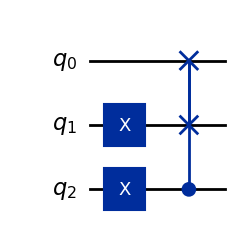

👉 Estado inicial:
➤ en forma de vector:


<IPython.core.display.Latex object>

➤ en forma de ket:


<IPython.core.display.Latex object>


👉 Estado después de SWAP(2, 0, 1):
➤ en forma de vector:


<IPython.core.display.Latex object>

➤ en forma de ket:


<IPython.core.display.Latex object>


🔵 Estado inicial:


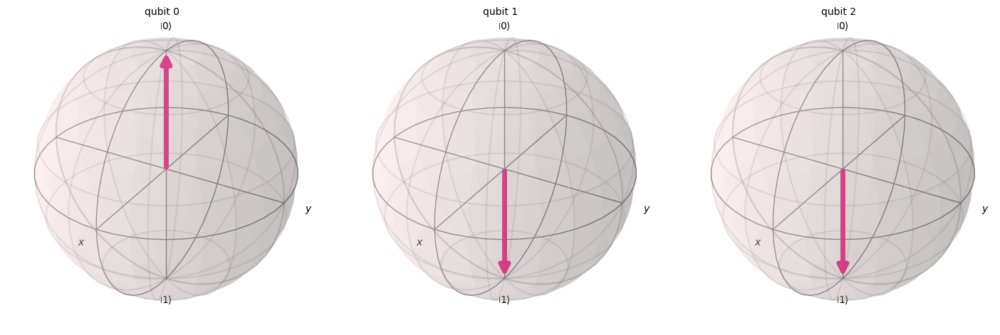

🔵 Estado después de SWAP(2, 0, 1):


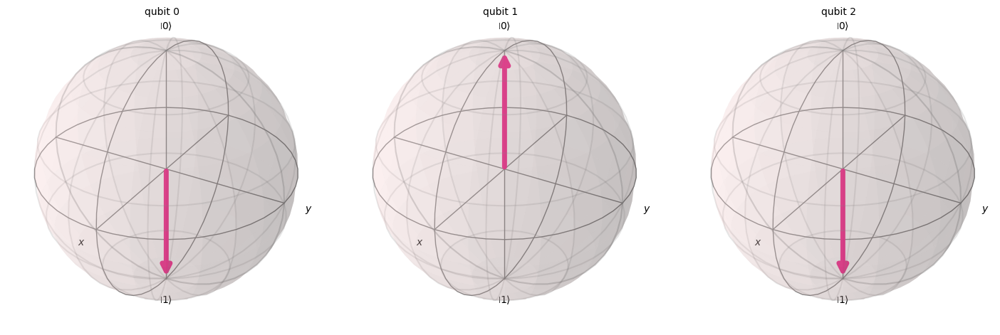

In [9]:
circ13 = QuantumCircuit(3)    # circuito con 3 qubit

circ13.x(2)                   # obtener el estado |100>
circ13.x(1)                   # obtener el estado |110>

psi_0 = Statevector(circ13)   # estado justo después de crear el circuito e iniciar el qubit en |110>

circ13.cswap(2, 0, 1)         # aplicar compuerta CCX: control1, objetivo1, objetivo2

psi_1 = Statevector(circ13)   # estado después aplicar la compuerta Z

display(circ13.draw('mpl'))   # mostrar el circuito

print("👉 Estado inicial:")
print("➤ en forma de vector:")
display(array_to_latex(psi_0))
print("➤ en forma de ket:")
display(psi_0.draw('latex'))
print()
print("👉 Estado después de SWAP(2, 0, 1):")
print("➤ en forma de vector:")
display(array_to_latex(psi_1))
print("➤ en forma de ket:")
display(psi_1.draw('latex'))

print()
print("🔵 Estado inicial:")
display(plot_bloch_multivector(psi_0))

print("🔵 Estado después de SWAP(2, 0, 1):")
display(plot_bloch_multivector(psi_1))

<a id="1.4.3"></a>
### 1.4.3. Compuerta controlada personalizada

Compuerta personalizada en Qiskit, con dos controles y dos objetivos:

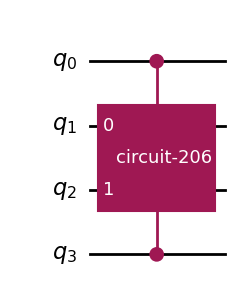

In [10]:
# Crear una compuerta a partir de un circuito
qc1 = QuantumCircuit(2)
# estos dos qubits serán los objetivos
qc1.x(0)
qc1.h(1)
custom = qc1.to_gate().control(2) # se indica que debe ser controlada con dos qubits

# Aplicar esa compuerta a otro circuito
qc2 = QuantumCircuit(4)
qc2.append(custom, [0, 3, 1, 2]) # primeros 2 son control, el resto a los que se aplica la compuerta
qc2.draw('mpl')

<a id="2"></a>
# 2. Estados de Bell: Entrelazamiento

Existen estados particulares con su propio nombre, tal es el caso de los estados de Bell. Son relevantes porque una vez creados dichos estados, se tiene que los dos qubits que los conforman están *entrelazados*. Representan los ejemplos más simples del [entrelazamiento cuántico](https://en.wikipedia.org/wiki/Quantum_entanglement).

Que los qubits estén entralazados significa que el estado no puede ser separado en el producto tensorial de dos qubits como $\ket{a}\otimes\ket{b}$.

Conozcamos los 4 estados de Bell:

$$\ket{\Phi^+}=\frac{1}{\sqrt2}\Big(\ket{00}+\ket{11}\Big)=\frac{1}{\sqrt2}\mymatrix{r}{ 1 \\ 0 \\ 0 \\ 1 }$$

$$~~~\ket{\Phi^-}=\frac{1}{\sqrt2}\Big(\ket{00}-\ket{11}\Big)=\frac{1}{\sqrt2}\mymatrix{r}{ 1 \\ 0 \\ 0 \\ -1 }$$

$$\ket{\Psi^+}=\frac{1}{\sqrt2}\Big(\ket{01}+\ket{10}\Big)=\frac{1}{\sqrt2}\mymatrix{r}{ 0 \\ 1 \\ 1 \\ 0 }$$

$$~~~\ket{\Psi^-}=\frac{1}{\sqrt2}\Big(\ket{01}-\ket{10}\Big)=\frac{1}{\sqrt2}\mymatrix{r}{ 0 \\ 1 \\ -1 \\ 0 }$$

<div class="alert alert-block alert-info">
<strong>Ejemplo</strong>: Confirmar que el estado $\ket{\Phi^+}$ no puede ser separado como $\ket{a}\otimes\ket{b}$.

Supongamos que si se puede, entonces se debe cumplir que,
    
$$\ket{a}\otimes\ket{b}=\mymatrix{r}{ a_1 \\ a_2 }\otimes\mymatrix{r}{ b_1 \\ b_2 }=\mymatrix{r}{ a_1b_1 \\ a_1b_2 \\ a_2b_1 \\ a_2b_2 }=\mymatrix{r}{ 1 \\ 0 \\ 0 \\ 1 }$$
    
Entonces $a_1b_2=0$, lo que implica que $a_1=0$ o que $b_2=0$, si $a_1=0$ entonces no puede cumplirse que $a_1b_1=1$, y si en cambio sucede que $b_2=0$, entonces hay contradicción con $a_2b_2=1$.
    
Por lo tanto no es posible expresar el estado $\ket{\Phi^+}$ como el producto tensorial de dos qubits separados ($\ket{a}\otimes\ket{b}$).

Veamos como generar los estados de Bell en Qiskit:

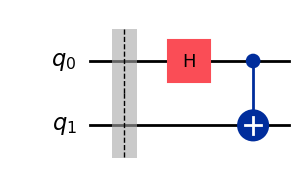

👉 Estado de Bell 1:
➤ en forma de vector:


<IPython.core.display.Latex object>

➤ en forma de ket:


<IPython.core.display.Latex object>

In [11]:
circ_bell_1 = QuantumCircuit(2)    # circuito con 2 qubits

circ_bell_1.barrier()
circ_bell_1.h(0)                   # aplicar compuerta H al qubit 0
circ_bell_1.cx(0,1)                # aplicar compuerta CNOT

psi_bell_1 = Statevector(circ_bell_1)   # estado final

display(circ_bell_1.draw('mpl'))   # mostrar el circuito

print("👉 Estado de Bell 1:")
print("➤ en forma de vector:")
display(array_to_latex(psi_bell_1))
print("➤ en forma de ket:")
display(psi_bell_1.draw('latex'))

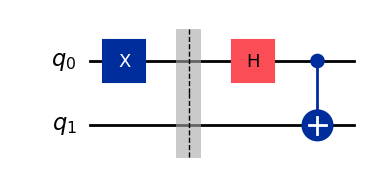

👉 Estado de Bell 2:
➤ en forma de vector:


<IPython.core.display.Latex object>

➤ en forma de ket:


<IPython.core.display.Latex object>

In [12]:
circ_bell_2 = QuantumCircuit(2)    # circuito con 2 qubits

circ_bell_2.x(0)                   # aplicar compuerta X al qubit 0
circ_bell_2.barrier()
circ_bell_2.h(0)                   # aplicar compuerta H al qubit 0
circ_bell_2.cx(0,1)                # aplicar compuerta CNOT

psi_bell_2 = Statevector(circ_bell_2)   # estado final

display(circ_bell_2.draw('mpl'))   # mostrar el circuito

print("👉 Estado de Bell 2:")
print("➤ en forma de vector:")
display(array_to_latex(psi_bell_2))
print("➤ en forma de ket:")
display(psi_bell_2.draw('latex'))

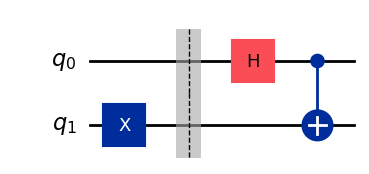

👉 Estado de Bell 2:
➤ en forma de vector:


<IPython.core.display.Latex object>

➤ en forma de ket:


<IPython.core.display.Latex object>

In [13]:
circ_bell_3 = QuantumCircuit(2)    # circuito con 2 qubits

circ_bell_3.x(1)                   # aplicar compuerta X al qubit 1
circ_bell_3.barrier()
circ_bell_3.h(0)                   # aplicar compuerta H al qubit 0
circ_bell_3.cx(0,1)                # aplicar compuerta CNOT

psi_bell_3 = Statevector(circ_bell_3)   # estado final

display(circ_bell_3.draw('mpl'))   # mostrar el circuito

print("👉 Estado de Bell 2:")
print("➤ en forma de vector:")
display(array_to_latex(psi_bell_3))
print("➤ en forma de ket:")
display(psi_bell_3.draw('latex'))

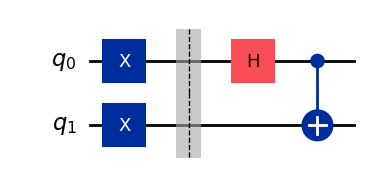

👉 Estado de Bell 2:
➤ en forma de vector:


<IPython.core.display.Latex object>

➤ en forma de ket:


<IPython.core.display.Latex object>

In [14]:
circ_bell_4 = QuantumCircuit(2)    # circuito con 2 qubits

circ_bell_4.x(0)                   # aplicar compuerta X al qubit 0
circ_bell_4.x(1)                   # aplicar compuerta X al qubit 1
circ_bell_4.barrier()
circ_bell_4.h(0)                   # aplicar compuerta H al qubit 0
circ_bell_4.cx(0,1)                # aplicar compuerta CNOT

psi_bell_4 = Statevector(circ_bell_4)   # estado final

display(circ_bell_4.draw('mpl'))   # mostrar el circuito

print("👉 Estado de Bell 2:")
print("➤ en forma de vector:")
display(array_to_latex(psi_bell_4))
print("➤ en forma de ket:")
display(psi_bell_4.draw('latex'))

¿Qué pasa si queremos ver un estado entrelazado usando esferas de Bloch?

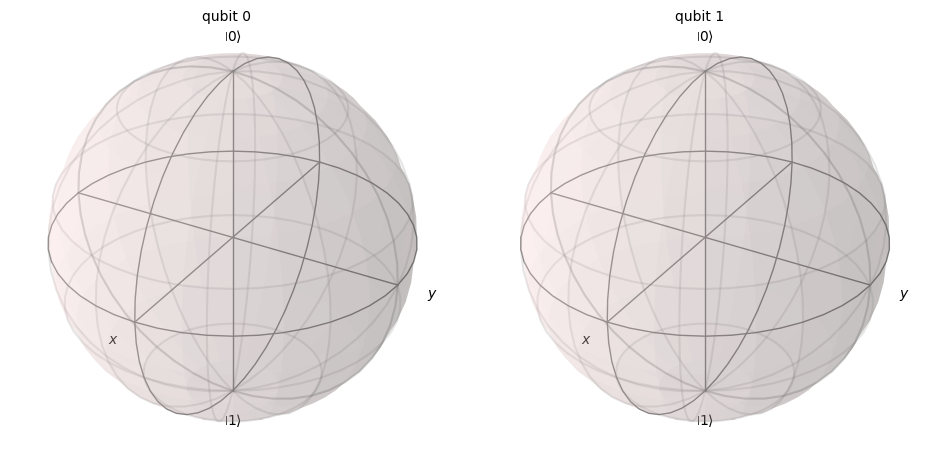

In [15]:
display(plot_bloch_multivector(psi_bell_4))

No se ven los vectores, esto debido a que los estados están entrelazados y por lo tanto no podemos tener una representación con producto tensorial de dos qubits como $\ket{a}\otimes\ket{b}$, al no existir $\ket{a}$ ni $\ket{b}$, no tenemos vectores que puedan ser dibujados sobre esferas de Bloch.

<br><br>

**Nota**: Para revisar otros estados entrelazados, como los estados $GHZ$ o los estados $W$, puedes visitar [este notebook](https://qczm.link/ses02).

<br><br>

<a id="3"></a>
# 3. QSphere, otra forma de visualizar estados multi-qubit

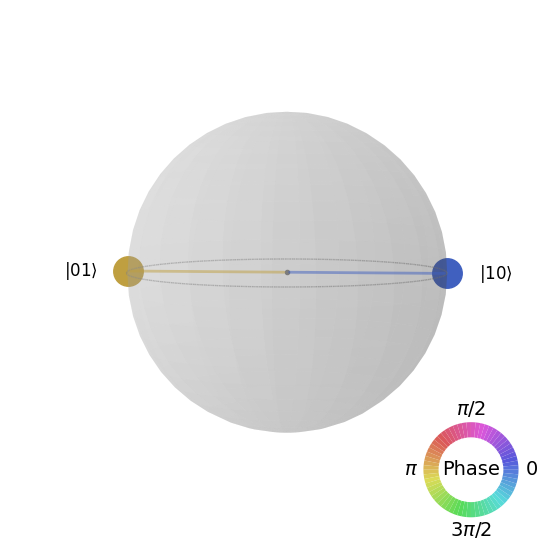

In [16]:
psi_bell_4.draw('qsphere')

La QSphere representa el estado de un sistema de uno o más qubits al asociar cada estado base computacional con un punto en la superficie de una esfera. Un nodo es visible en cada punto. El radio de cada nodo es proporcional a la probabilidad ($p_k$) de su estado base, mientras que el color del nodo indica la fase cuántica ($\phi_k$).

Los nodos se disponen en la QSphere de modo que el estado base con todos ceros (p. ej. $\ket{000}$), está en el polo norte, y el estado base con todos unos (p. ej., $\ket{111}$) está en el polo sur. Los estados base con el mismo número de ceros (o unos) se encuentran en una latitud compartida de la QSphere (por ejemplo, $\ket{001}$, $\ket{010}$, $\ket{100}$). Comenzando en el polo norte y avanzando hacia el sur, cada latitud sucesiva tiene estados base con un mayor número de unos; la latitud de un estado base está determinada por su [distancia de Hamming](https://en.wikipedia.org/wiki/Hamming_distance) desde el estado 0. La QSphere contiene información completa sobre el estado cuántico en una representación compacta.

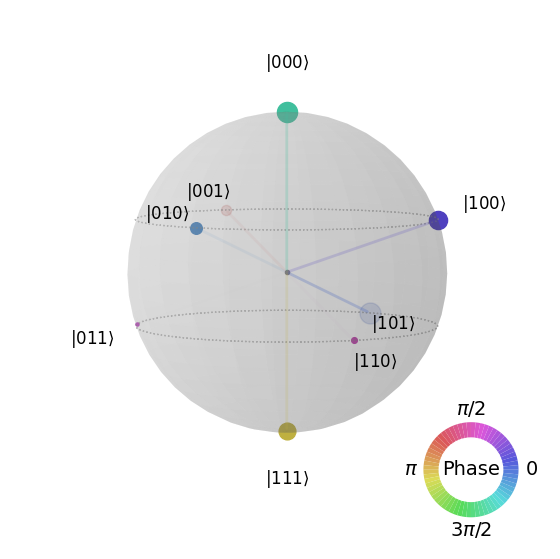

In [17]:
from qiskit.quantum_info import random_statevector
from qiskit.visualization import plot_state_qsphere


estado_aleatorio_3qubits = random_statevector(2**3)

plot_state_qsphere(estado_aleatorio_3qubits)

Es importante resaltar que la QSphere no es lo mismo que la esfera de Bloch, ni siquiera para un solo qubit. De hecho, la esfera de Bloch brinda una vista local del estado cuántico, donde cada qubit se ve por sí solo. Al tratar de comprender cómo se comportan los registros de qubits (estados de múltiples qubits) con la aplicación de circuitos cuánticos, es más revelador tener una visión global y observar el estado cuántico en su totalidad. La QSphere proporciona una representación visual del estado cuántico y, por lo tanto, de este punto de vista global.

Cabe señalar que la QSphere tiene un máximo de 5 qubits, es decir, estados de más qubits no pueden ser visualizados de esta forma.

<a id="4"></a>
# 4. Simular Circuitos Cuánticos

Ya sabemos crear cicuitos y manipular sus qubits. Lo que sigue es ejecutar dichos circuitos y obtener las ventajas de la parte cuántica, es decir, permitir que las probabiliadades entren en juego al momento de observar los resultados.

Hasta ahora, hemos mostrado información sobre el estado final (e intermedios) suponiendo un circuito ideal y sin forzar un colapso del resutado, hemos visto el estado como si solo efectuaramos las operaciones matemáticas, comprobando que las mismas funcionan, pero no hemos hecho nada cuántico.

Sin embargo, un experimento real termina midiendo cada qubit (normalmente sobre la base computacional $\{\ket{0}, \ket{1}\}$). Sin medición, no podemos obtener información sobre el estado. **Las mediciones hacen que el sistema cuántico colapse en bits clásicos**.

<a id="4.1"></a>
## 4.1. Medición

Reconsideremos el sistema de un solo qubit $\alpha|0\rangle + \beta|1\rangle$

¿Cómo descubrimos las probabilidades de medir cada estado? ¡Realizamos mediciones!

Una medición sobre un qubit lleva a un "colapso" instantáneo del estado cuántico a un estado clásico que podemos codificar en un bit clásico de información.

Debido a la naturaleza probabilística de las computadoras cuánticas, debemos realizar mediciones repetidas usando qubits preparados en el mismo estado para obtener lecturas más precisas.

Podemos medir un sistema cuántico en las bases $Z$ (default), $X$ o $Y$ rotando el qubit de cierta manera antes de hacer una medición normal.

<div align="center">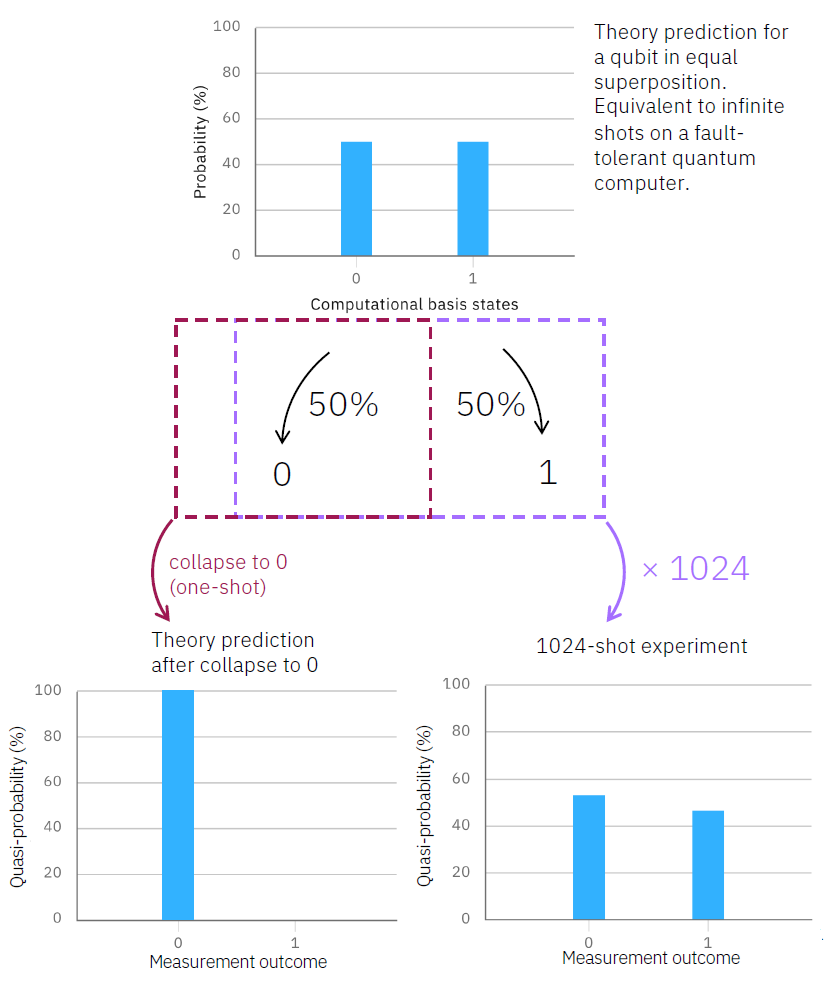

<a id="4.2"></a>
## 4.2. Ejemplo: Estado GHZ

Supongamos el siguiente estado de $3$ qubits, conocido como [estado GHZ](https://en.wikipedia.org/wiki/Greenberger%E2%80%93Horne%E2%80%93Zeilinger_state),

$$\ket{\psi}=\frac{1}{\sqrt2}\Big(\ket{000}+\ket{111}\Big)$$

Denotemos la cadena de bits resultante como $abc$. Recordemos que, bajo el etiquetado de qubits utilizado por Qiskit ($\ket{q_2q_1q_0}$), $a$ correspondería al resultado en el qubit 2, $b$ al resultado en el qubit 1, y $c$ al resultado en qubit 0.

Ahora, la probabilidad de obtener un resultado $abc$ viene dada por,

$$Pr(abc)=|\braket{abc}{\psi}|^2$$

En particular para el estado GHZ, la probabilidad de obtener $000$ o $111$ es $\frac{1}{2}$.

<div class="alert alert-block alert-info">
<strong>Ejemplo</strong>: Calcular la probabilidad de medir $111$ en el estado $\ket{\psi}=\frac{1}{\sqrt2}\Big(\ket{000}+\ket{111}\Big)$.

Utilizamos la ecuación indicada para calcular la probabilidad,
    
$$\begin{aligned}
\Pr(111)&=|\braket{111}{\psi}|^2\\
&=\left|\left\langle 111\Bigg|\frac{1}{\sqrt2}\Big(\ket{000}+\ket{111}\Big)\right\rangle\right|^2\\
&=\left|\frac{1}{\sqrt2}\left\langle 111\Bigg|\Big(\ket{000}+\ket{111}\Big)\right\rangle\right|^2\\
&=\left|\frac{1}{\sqrt2}\Bigg(\left\langle 111\Big|000\right\rangle+\left\langle 111\Big|111\right\rangle\Bigg)\right|^2\\
&=\left|\frac{1}{\sqrt2}\Big(0+1\Big)\right|^2\\
&=\left|\frac{1}{\sqrt2}\right|^2\\
&=\frac{1}{2}
\end{aligned}$$


Para poder simular un circuito, es necesario indicar que qubits queremos medir y elegir en dónde queremos guardar la medición, que serán bits clásicos y necesitamos uno por cada qubit a medir.

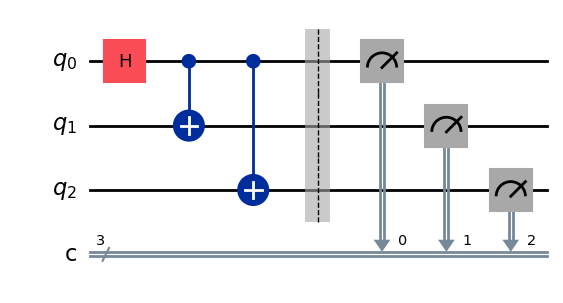

In [18]:
circ_ghz = QuantumCircuit(3, 3)     # circuito con 3 qubits y 3 bits clásicos

circ_ghz.h(0)                       # aplicar compuerta H al qubit 0
circ_ghz.cx(0, 1)                   # aplicar compuerta CNOT a los qubits 0 y 1
circ_ghz.cx(0, 2)                   # aplicar compuerta CNOT a los qubits 0 y 2
circ_ghz.barrier()
circ_ghz.measure([0,1,2], [0,1,2])  # medir los 3 qubits en los 3 bits clásicos

circ_ghz.draw('mpl')                # mostrar el circuito

Con la clase `BasicSimulator` podemos obtener de manera rápida y básica el resultado de la ejecución de circuitos cuánticos con pocos qubits (max 24); es una implementación en Python de un simulador cuántico no muy eficiente. Solo puede simular un conjunto limitado de compuertas cuánticas. Nos dara las mediciones en la base computacional.

In [19]:
from qiskit.providers.basic_provider import BasicSimulator

simulator_basic = BasicSimulator()

In [20]:
job = simulator_basic.run(circ_ghz, shots=1)
result = job.result()

counts = result.get_counts()
counts

{'111': 1}

<a id="4.3"></a>
## 4.3. Estadística: Múltiples *shots*

Cuando un circuito cuántico se mide **una vez**, el resultado es una única cadena de bits clásica muestreada de la distribución de probabilidad subyacente $\{p_{s}\}$, dictada por su estado $\lvert\psi\rangle$.

Dado que cada medición *destruye* el estado previo a la medición y devuelve solo una muestra, debemos **ejecutar el circuito muchas veces (o *shots*) para aprender empíricamente esa distribución**.

### De *shots* individuales a histogramas

* **Disparo o *shot* (o ejecución):** un ciclo completo de preparación-ejecución-medición del circuito.
* **Conteos:** después de $N$ *shots*, obtenemos los enteros $n_{s}\in\{0,1,\dots,N\}$ con $\sum_{s} n_{s}=N$.
* **Frecuencias relativas:**

$$
\hat{p}_{s} \;=\; \frac{n_{s}}{N}
$$

que sirven como *estimadores no sesgados* de las probabilidades reales $p_{s}$.

<br>

### Teoría básica del muestreo

Sea $X_{i}^{(s)}$ la variable aleatoria indicadora de que el $i$-ésimo *shot* produjo el resultado $s$:

$$
X_{i}^{(s)}=\begin{cases}
1, \text{si el resultado del shot }i\text{ es igual a }s\\[4pt]
0, \text{en caso contrario}
\end{cases}
$$

Entonces $n_{s}=\sum_{i=1}^{N}X_{i}^{(s)}$.

Dado que cada *shot* es un ensayo de Bernoulli independiente con probabilidad de éxito $p_{s}$,

$$
n_{s}\;\sim\;\mathrm{Binomial}\bigl(N,\,p_{s}\bigr), \qquad
\mathbb{E}[\,\hat{p}_{s}\,]=p_{s}, \qquad
\operatorname{Var}[\,\hat{p}_{s}\,]=\frac{p_{s}(1-p_{s})}{N}
$$

Para múltiples resultados mutuamente excluyentes, la distribución conjunta es **multinomial**.

Como $N\to\infty$, la **ley de los grandes números** garantiza $\hat{p}_{s}\to p_{s}$ casi con seguridad.

<br>

### Consideraciones prácticas

* Los **simuladores** permiten un valor de $N$ muy alto de forma económica, limitado únicamente por el tiempo de cálculo.  
* El **hardware real** suele limitar $N$ (o cobrar créditos) por trabajo; se busca un equilibrio entre precisión y costo.  
* En tomografía o evaluación comparativa de algoritmos, normalmente se selecciona $N$ para que la incertidumbre estadística sea muy inferior a la señal algorítmica prevista.

<br>

{'000': 508, '111': 516}


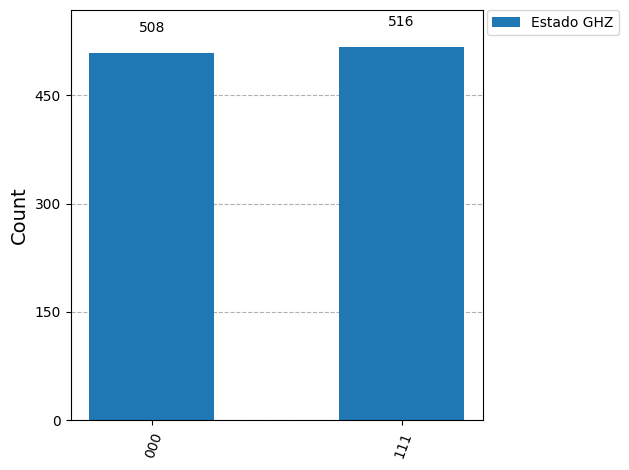

In [21]:
from qiskit.visualization import plot_histogram

job = simulator_basic.run(circ_ghz, shots=1024)   # <--- más shots
result = job.result()

counts = result.get_counts()

print(counts)

plot_histogram(counts, legend=["Estado GHZ"])

<a id="4.4"></a>
## 4.4. Primitivas de Qiskit

Qiskit presenta dos **primitivas** de alto nivel (**Sampler** y **Estimator**) que encapsulan las dos tareas numéricas fundamentales de los algoritmos cuánticos:

**(i)** extraer muestras de la distribución de salida de un circuito
**(ii)** calcular los valores esperados de los observables

<br>

Reemplazan la interfaz `backend.run` de nivel inferior por una API uniforme e independiente del proveedor y ofrecen controles de mitigación de errores, como `resilience_level`, sin obligar al usuario a gestionar datos de trabajo sin procesar. ([IBM Quantum Docs1](https://docs.quantum.ibm.com/guides/primitives))

<br>

<a id="4.4.2"></a>
## 4.4.2 Sampler

Propósito
> "Lanzar los dados del circuito". Ejecutar uno o más circuitos cuánticos con mediciones (opcionalmente con barridos de parámetros) y **devolver las cadenas de bits sin procesar producidas en cada *shot***.

<br>

**Entradas**: una lista de *bloques unificados de primitivas* (PUB: primitive-unified blocs)

$$
\text{PUB}=(\;\texttt{circuit},\;\texttt{parameter\_values(opcional)},\;\texttt{shots(opcional)}\;)
$$

Todos los circuitos deben contener mediciones; no se proporcionan observables. ([IBM Quantum Docs2](https://docs.quantum.ibm.com/migration-guides/v2-primitives))

<br>

**Salidas**: una lista de objetos `PubResult`, uno por PUB. Cada campo `PubResult.data` almacena una matriz bidimensional de cadenas de bits en el *orden en que se midieron*. Métodos auxiliares como `.get_counts()` sumarizan estas matrices en el histograma habitual.

$$
n_s \longmapsto \hat p_s=\frac{n_s}{N}
$$

<br>

*¿Por qué es útil?*

* **Amigable con las estadísticas**: Conservar cada *shot* permite construir cualquier estimador (conteos, comprobaciones de paridad, probabilidades condicionales) sin tener que volver a ejecutar el hardware.
* **Preparado para la mitigación de ruido**: La primitiva puede aplicar internamente técnicas como la mitigación de errores de lectura; solo se debe activar una bandera.
* **Rendimiento**: Los *shots*, parámetros y circuitos son vectorizados; Qiskit los agrupa en un solo trabajo, minimizando la latencia de la red.

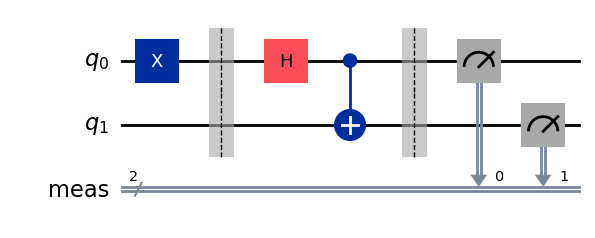

{'00': 1024, '11': 1024}


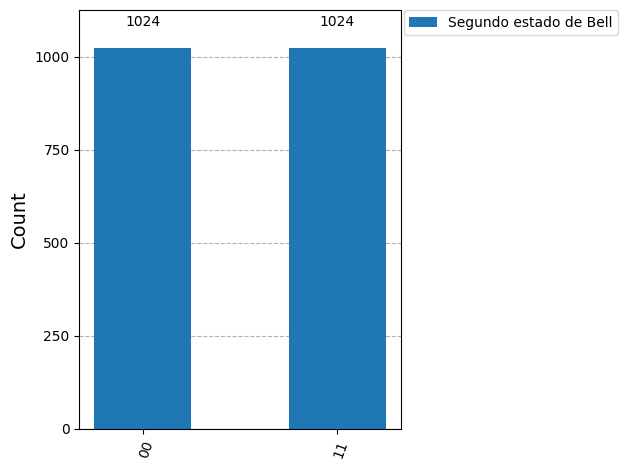

In [22]:
from qiskit.primitives import StatevectorSampler as Sampler

sampler = Sampler()

shots = 2048

circ_bell_2.measure_all()     # medir todos los qubits

display(circ_bell_2.draw('mpl'))

# Muestrear un circuito con 2048 shots (un PUB)
job_sampler = sampler.run([(circ_bell_2, None, shots)])

result = job_sampler.result()

counts_sampler = result[0].data.meas.get_counts()        # se usa "meas"

print(counts_sampler)

plot_histogram(counts_sampler, legend=["Segundo estado de Bell"])

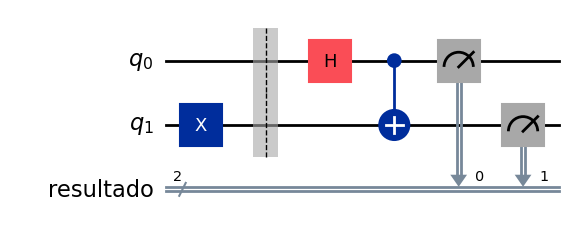

{'10': 1026, '01': 1022}


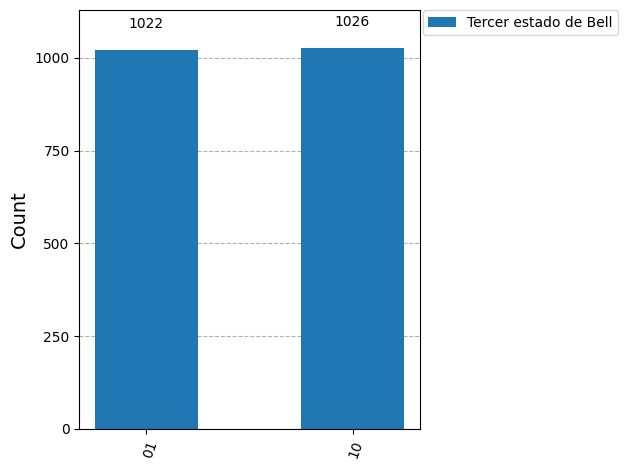

In [23]:
from qiskit import ClassicalRegister

cr = ClassicalRegister(2, 'resultado')

circ_bell_3.add_register(cr)

circ_bell_3.measure(0, 0)
circ_bell_3.measure(1, 1)


display(circ_bell_3.draw('mpl'))

job_sampler = sampler.run([(circ_bell_3, None, shots)])

result = job_sampler.result()

counts_sampler = result[0].data.resultado.get_counts()        # se usa "resultado"

print(counts_sampler)

plot_histogram(counts_sampler, legend=["Tercer estado de Bell"])

<a id="4.4.2"></a>
## 4.4.2 Estimator

Propósito
> "Medir un observable". Calcular el **valor esperado**:
>
> $$\langle O\rangle_{\psi}=\langle\psi|\,O\,|\psi\rangle$$
>
>para uno o más observables $O$ con respecto a los estados preparados por circuitos (posiblemente parametrizados).

<br>

- **Valor esperado**: Es el **promedio** que esperamos obtener al medir muchas veces un qubit en un cierto estado.  
- **Observable**: Es una **propiedad que se puede medir** de un sistema cuántico, como la energía, la posición o el espín.  
  Matemáticamente, todo observable se representa con una matriz hermítica. Estas matrices tienen valores reales como resultados posibles, y eso es lo que medimos.
- **Medir un observable**: Es aplicar una regla que **nos da un número concreto** (como $+1$ o $–1$) según el estado del qubit.  
  Por ejemplo, medir el observable $Z$ implica medir el espín en el eje z, lo que nos da $+1$ o $–1$.  
  En computación cuántica, una misma matriz puede **actuar como una compuerta cuando la aplicas**, o como un **observable cuando la mides**.

<br>

**Entradas**: una lista de PUBs

$$
\text{PUB}=(\;\texttt{circuito},\;\texttt{observables},\;\texttt{parameter\_values(opcional)},\;\texttt{precision(opcional)}\;)
$$

La lista de observables y la lista de parámetros se **difunden** (broadcast) al estilo de NumPy, por lo que un solo circuito puede emparejarse con varios $O$s (observables) o conjuntos de parámetros en una sola llamada. ([IBM Quantum Docs1](https://docs.quantum.ibm.com/guides/primitives), [IBM Quantum Docs2](https://docs.quantum.ibm.com/migration-guides/v2-primitives) )

<br>

**Salidas**: una lista de valores esperados $E_i$ y sus errores estándar $\sigma_i$ almacenados en `PubResult.data.{evs, stds}`. La primitiva descompone automáticamente cada observable en términos de Pauli, programa las rotaciones de base necesarias y realiza la agregación estadística, lo que te ahorra cientos de líneas manuales. ([IBM Quantum Docs3](https://learning.quantum.ibm.com/course/variational-algorithm-design/cost-functions) )

<br>

*¿Por qué es útil?*

* **Algoritmos variacionales**: VQE, QAOA y muchas funciones de costo de machine learning iteran sobre $\langle O\rangle$. Estimator convierte el paso cuántico en una única "llamada a función" dentro de un optimizador clásico.  
* **Incluye barras de error**: el $\sigma$ devuelto permite establecer recuentos de *shots* de forma adaptativa o finalizar la optimización cuando predomina el ruido estadístico.
* **Abstracción del proveedor**: independientemente de si se ejecuta en una IBM QPU, un simulador de vector de estado local (`StatevectorEstimator`) o un backend de terceros con `BackendEstimatorV2`, el patrón de llamada y el esquema de resultados son idénticos.

<br>

> Juntos forman la columna vertebral de los flujos de trabajo modernos de Qiskit: **Sampler** proporciona los datos estadísticos sin procesar, y **Estimator** condensa esos datos en las cantidades físicas que consumen los algoritmos variacionales e híbridos.

### Valores esperados

En mecánica cuántica, el **valor esperado** es el promedio probabilístico del resultado de una medición: es el número que se obtiene si se pudiera repetir el mismo experimento infinitas veces y promediar los resultados. Fundamentalmente, *no* es necesariamente uno de los resultados que se pueden observar de una sola vez; por ejemplo, un operador cuyos eigenvalores son enteros puede tener un valor esperado de $1/2$.

<br>

**Definición**

Para un estado normalizado $\lvert\psi\rangle$ y un observable (operador hermítico) $A$,

$$
\langle A\rangle_{\psi}\;=\;\langle\psi|\,A\,|\psi\rangle
$$

da el valor esperado de $A$ en ese estado.

Si $A$ tiene una descomposición propia completa
$A = \sum_{j} a_{j}\,\lvert\phi_{j}\rangle\langle\phi_{j}\rvert$, entonces

$$
\langle A\rangle_{\psi}
=\sum_{j} a_{j}\,\lvert\langle\phi_{j}\mid\psi\rangle\rvert^{2}
$$

donde

* cada $a_{j}$ es un **posible resultado de medición**, y
* $\lvert\langle\phi_{j}\mid\psi\rangle\rvert^{2}$ es la **probabilidad** de ese resultado (la regla de Born).

Esta suma ponderada es la media aritmética de todos los resultados posibles, ponderados por sus probabilidades, precisamente la cantidad que devuelve el **Estimator** primitivo de Qiskit, junto con una barra de error.

In [24]:
from qiskit.primitives import StatevectorEstimator as Estimator

from qiskit.primitives import StatevectorEstimator as Estimator
from qiskit.quantum_info import SparsePauliOp


O = SparsePauliOp("ZZ")

estimator = Estimator()

job_estimator = estimator.run([(circ_bell_1, O)])

result = job_estimator.result()

print(f"Valor esperado: {result[0].data.evs:.5}")
print(f"Error estándar: {result[0].data.stds}")     # el resultado de esta clase es exacto si el circuito contiene solo operaciones unitarias

Valor esperado: 1.0
Error estándar: 0.0


El primer estado de Bell es:

$$
|\Phi^+\rangle = \frac{1}{\sqrt{2}}(|00\rangle + |11\rangle)
$$

Entonces al medir el observable $Z \otimes Z$ (ZZ), los estados $|00\rangle$ y $|11\rangle$ **ambos tienen valor $+1$** bajo ZZ:

* $ZZ|00\rangle = (+1)(+1)|00\rangle = +1|00\rangle$
* $ZZ|11\rangle = (-1)(-1)|11\rangle = +1|11\rangle$

Como ambos términos del estado tienen valor $+1$, el **valor esperado es $+1$**.


In [25]:
observables = [
    SparsePauliOp("II"),   # identidad
    SparsePauliOp("ZI"),   # Z en el qubit izquierdo
    SparsePauliOp("IZ"),   # Z en el qubit derecho
    SparsePauliOp("ZZ"),   # correlación Z⊗Z
    SparsePauliOp("XX"),   # correlación X⊗X
    SparsePauliOp("YY"),   # correlación Y⊗Y
]

job_estimator = estimator.run([(circ_bell_1, observables)])
result = job_estimator.result()

print("\nObservable\t Valor esperado\n")
for i in range(6):
  print(f"{observables[i].paulis} \t\t {result[0].data.evs[i]:.5}")


Observable	 Valor esperado

['II'] 		 1.0
['ZI'] 		 0.0
['IZ'] 		 0.0
['ZZ'] 		 1.0
['XX'] 		 1.0
['YY'] 		 -1.0


**Derivación de $ZZ$:**

$$
\bigl\langle\Phi^{+}\bigr|\,ZZ\,\bigl|\Phi^{+}\bigr\rangle
$$

Tenemos que

$$
ZZ \;=\; Z\otimes Z, \qquad
Z\lvert0\rangle=\lvert0\rangle,\; Z\lvert1\rangle=-\lvert1\rangle
$$

Entonces

$$
\begin{aligned}
ZZ\,\lvert00\rangle &= (+1)\lvert00\rangle\\[2pt]
ZZ\,\lvert11\rangle &= (-1)(-1)\,\lvert11\rangle = (+1)\lvert11\rangle
\end{aligned}
$$

<br>

Así que ambos componentes de $\lvert\Phi^{+}\rangle$ son **vectores propios con valor propio $+1$.**

<br>

Ahora, sustituyamos en la fórmula del valor esperado:

$$
\begin{aligned}
\langle\Phi^{+}|ZZ|\Phi^{+}\rangle
&= \frac{1}{\sqrt2}\frac{1}{\sqrt2}\bigl(\langle00|+\langle11|\bigr)ZZ\bigl(|00\rangle+|11\rangle\bigr) \\[6pt]
&= \frac{1}{2}\Bigl[\;\langle00|ZZ|00\rangle
                     +\langle00|ZZ|11\rangle
                     +\langle11|ZZ|00\rangle
                     +\langle11|ZZ|11\rangle\Bigr]
\end{aligned}
$$

<br>

* **Términos diagonales**  
  $\langle00|ZZ|00\rangle = \langle00|00\rangle = 1$  
  $\langle11|ZZ|11\rangle = \langle11|11\rangle = 1$  

* **Términos cruzados**  
  $\langle00|ZZ|11\rangle = 0$  
  $ \langle11|ZZ|00\rangle = 0$  
  (ortogonalidad de la base computacional)

<br>

Por lo tanto,

$$
\langle\Phi^{+}|\,ZZ\,|\Phi^{+}\rangle
= \frac{1}{2}\,(1 + 0 + 0 + 1)
= \frac{1}{2}\times 2
= 1.
$$

<br>

En el estado de Bell $\lvert\Phi^{+}\rangle$, los dos qubits son *siempre iguales* (ambos $0$ o ambos $1$); por lo tanto, el observable de paridad $Z\otimes Z$ devuelve su valor propio máximo $+1$ con certeza.

| Observable | Valores propios en estados base | $\langle\Phi^{+}\vert\, O\, \vert\Phi^{+}\rangle$&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; | Significado intuitivo |
|:----|:----|:----|:----|
| **II** | siempre $+1$ | &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;$1$ | Un estado está perfectamente correlacionado consigo mismo |
| **ZI** | $+1$ en $\lvert0\_\_\rangle$, $-1$ en $\lvert1\_\_\rangle$ | &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;$0$ | El qubit izquierdo tiene la misma probabilidad de ser $0$ o $1$ (máximamente mixto) |
| **IZ** | Lo mismo, pero en el qubit derecho | &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;$0$ | Mismo razonamiento para el qubit derecho |
| **ZZ** | $+1$ si los dos bits son iguales, $-1$ si son diferentes | &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;$+1$ | En $\lvert\Phi^{+}\rangle$ los qubits son *siempre* iguales ($00$ o $11$) |
| **XX** | $+1$ si la paridad en la base $X$ coincide | &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;$+1$ | La correlación persiste en la base rotada ($X$) |
| **YY** | $+1$ si la paridad es la misma, $-1$ en caso contrario | &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;$-1$ | Una fase $\pi/2$ entre $\lvert00\rangle$ y $\lvert11\rangle$ invierte este signo; $\lvert\Phi^{+}\rangle$ adquiere $-1$ |

<br>

* **Las expectativas de un solo qubit se desvanecen ($0$)**  
  Cada qubit, por sí solo, presenta una mezcla máxima, aunque el *par* esté perfectamente ordenado.

* **Los correladores de dos qubits revelan entrelazamiento**  
  $\langle ZZ\rangle=+1$ indica que los bits *siempre* coinciden;  
  $\langle XX\rangle=+1$ indica que lo mismo ocurre en la base $X$.  
  Las correlaciones clásicas podrían dar $+1$ para una base, pero no para ambas.

* **$\langle YY\rangle=-1$ es un testigo de fase**  
  El signo distingue $\lvert\Phi^{+}\rangle$ de $\lvert\Phi^{-}\rangle$ (donde sería $+1$).  
  Por lo tanto, $YY$ revela la *fase relativa* oculta a $ZZ$ o $XX$.

En conjunto, estos valores esperados caracterizan completamente el estado de Bell e ilustran cómo la medición de diferentes tensores de Pauli investiga las propiedades de **población, correlación y fase** de un estado cuántico.

<a id="5"></a>
# 5. Errores y cómo corregirlos

[NISQ](https://en.wikipedia.org/wiki/Noisy_intermediate-scale_quantum_era) (Noisy Intermediate-Scale Quantum) es un término acuñado por el físico [John Preskill](https://en.wikipedia.org/wiki/John_Preskill) para describir la era actual de la computación cuántica, caracterizada por la disponibilidad de dispositivos cuánticos con un número moderado de qubits (de decenas a cientos) que son susceptibles al ruido y a errores. En esta fase, los qubits aún no son perfectamente fiables y las correcciones de errores completas no son factibles debido a las limitaciones tecnológicas actuales.

<div align="center">
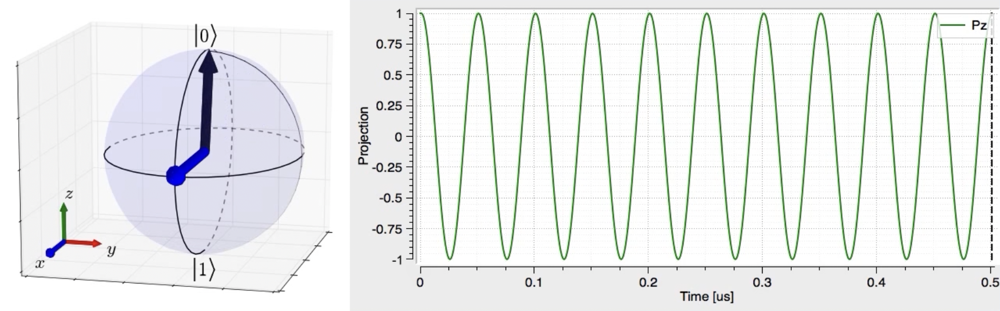

<div align="center">
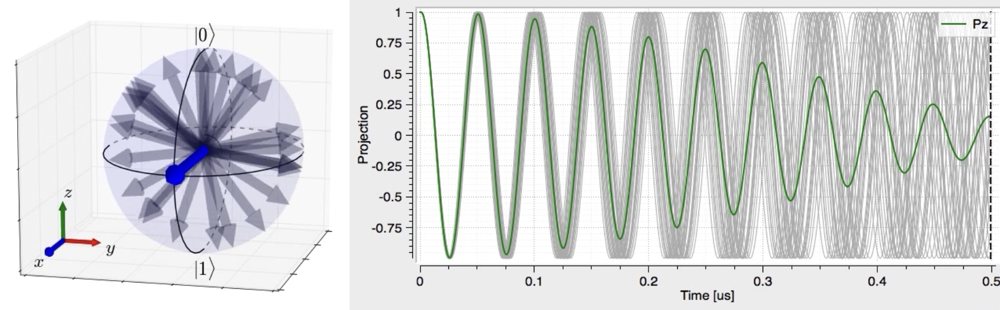

<a id="5.1"></a>
## 5.1. Mitigación de errores

La mitigación de errores es una técnica utilizada en computación cuántica para reducir el impacto de los errores sin necesidad de la redundancia de qubits o sobrecarga significativa en la computación. A diferencia de la corrección de errores, la mitigación de errores no intenta corregir los errores directamente, sino que busca minimizar su efecto en los resultados finales. Algunas de las estrategias más comunes para la mitigación de errores incluyen:

1. **Filtrado de resultados**: Se pueden aplicar filtros para eliminar mediciones que claramente han sido afectadas por errores.
2. **Extrapolación a ruido cero**: Este método implica ejecutar el mismo circuito cuántico con diferentes niveles de ruido (controlando parámetros como el tiempo de ejecución) y extrapolar los resultados a un escenario con ruido cero.
3. **Corrección basada en modelos**: Consiste en construir modelos del comportamiento del ruido en el hardware y usar estos modelos para ajustar los resultados medidos.
4. **Descomposición de operaciones**: Dividir operaciones cuánticas en sub-operaciones menos ruidosas y combinar los resultados para obtener una salida menos ruidosa.
5. **Averaging (promediado)**: Realizar múltiples ejecuciones del circuito y promediar los resultados para reducir el impacto de fluctuaciones aleatorias.

<a id="5.2"></a>
## 5.2. Corrección de errores

La corrección de errores cuánticos es un conjunto de técnicas más robusto y complejo que tiene como objetivo detectar y corregir los errores en qubits durante la computación cuántica. A diferencia de la mitigación de errores, la corrección de errores añade redundancia al sistema cuántico, utilizando múltiples qubits para proteger la información. Los principios y técnicas fundamentales incluyen:

1. **Codificación de la información**: Utilizar más de un qubit para representar un único qubit lógico. Por ejemplo, en el [código de Shor](https://errorcorrectionzoo.org/c/shor_nine), se utilizan 9 qubits físicos para representar 1 qubit lógico.
2. **Síndromes de error**: Medir síndromes de error que indican qué tipo de error ha ocurrido sin colapsar el estado cuántico. Esta información se utiliza para inferir y corregir el error.
3. **Códigos cuánticos**: Existen diversos códigos cuánticos, como el Código de Shor, el Código de Steane y los códigos CSS (Calderbank-Shor-Steane), cada uno con diferentes capacidades para detectar y corregir errores.
4. **Operaciones correctivas**: Una vez identificado el error, se aplican operaciones correctivas para devolver el qubit a su estado original.

La corrección de errores es esencial para la computación cuántica a gran escala porque los qubits son extremadamente susceptibles al ruido y a los errores operacionales. Implementar estas técnicas requiere un número significativo de qubits físicos, lo que actualmente representa un desafío debido a las limitaciones tecnológicas y la coherencia temporal de los qubits.

Para una lista más exhaustiva de algoritmos de corrección de errores (clásicos y cuánticos) visitar el [Error Correction Zoo](https://errorcorrectionzoo.org/).

<a id="5.3"></a>
## 5.3. Diferencias

- **Objetivo**: La mitigación de errores busca reducir el impacto de los errores en los resultados sin necesidad de corregirlos directamente, mientras que la corrección de errores busca identificar y corregir activamente los errores.
- **Complejidad**: La mitigación de errores suele ser menos compleja y requiere menos recursos adicionales en comparación con la corrección de errores, que implica redundancia significativa y operaciones adicionales.
- **Uso de qubits**: La mitigación de errores no necesariamente aumenta el número de qubits necesarios, mientras que la corrección de errores requiere un número mucho mayor de qubits para representar y proteger la información.

Ambas estrategias son complementarias y pueden utilizarse en conjunto para mejorar la precisión y la fiabilidad de los cálculos cuánticos.

<a id="6"></a>
# 6. Referencias

- Qiskit Documentation. Consultado en https://quantum.cloud.ibm.com/docs
- Qiskit Learning. Consultado en https://quantum.cloud.ibm.com/learning
- Qiskit Tutorials. Consultado en https://quantum.cloud.ibm.com/docs/tutorials
- QWold's Bronze tutorial. Consultado en https://gitlab.com/qworld/bronze-qiskit
- Nielsen, M., & Chuang, I. (2010). Quantum Computation and Quantum Information: 10th Anniversary Edition. Cambridge: Cambridge University Press. DOI:10.1017/CBO9780511976667
- Kaye P., Laflamme R., & Mosca M. (2007). An Introduction to Quantum Computing. Oxford: Oxford University Press. ISBN: 9780198570493